# London Real Estate Pricing Analysis

## Introduction
In this project I have scraped data from various data about London real estate price and its Boroughs.Then I used Foursquare API to get the common venues of the boroughs.Then using K-means clustering I clustered London Neighborhoods on the basis of the common venues.

# Importing Libraries

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

import geocoder as geocoder
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library

print('Libraries imported.')

Libraries imported.


# Scraping table from Wikipedia

In [13]:
import pandas as pd
import wikipedia as wp
 
#Get the html source
html = wp.page("List of areas of London").html().encode("UTF-8")
df = pd.read_html(html)[1]
df.head()

,Location,London borough,Post town,Postcode district,Dial code,OS grid ref
0,Abbey Wood,"Bexley, Greenwich [2]",LONDON,SE2,020,TQ465785
1,Acton,"Ealing, Hammersmith and Fulham[3]",LONDON,"W3, W4",020,TQ205805
2,Addington,Croydon[3],CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon[3],CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,"BEXLEY, SIDCUP","DA5, DA14",020,TQ478728


In [32]:
df.columns

Index(['location', 'london borough', 'post_town', 'postcode district',
       'dial code', 'os_grid_ref'],
      dtype='object')

In [59]:
df.columns = ['Location','London_borough','Post town','Postcode district','Dial Code','OS grid ref']

## Cleaning the table

The table contains hyperlinks numbers and there are more than one Postal codes so I decided to keep one.

In [89]:
df['London_borough'] =  df['London_borough'].apply(lambda x: x.replace('[','').replace(']','')) 
df['London_borough'] =  df['London_borough'].str.replace('\d+', '')
df['London_borough'] =  df['London_borough'].str.split(',').str[0]
df['Postcode district'] =  df['Postcode district'].str.split(',').str[0]
df['Postcode district'] =  df['Postcode district'].str.split('(').str[0]
df['Post town'] =  df['Post town'].str.split(',').str[0]

In [90]:
df.head()

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785
1,Acton,Ealing,LONDON,W3,020,TQ205805
2,Addington,Croydon,CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon,CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,BEXLEY,DA5,020,TQ478728


In [92]:
df.to_csv('london.csv',index=False)

In [78]:
df.shape

(533, 6)

# Getting property data of London
 
This time it was not a wikipedia page so I use pandas read_html function to scrape data.

In [102]:
tables = pd.read_html("https://propertydata.co.uk/cities/london",header=0)
df2=pd.DataFrame(data=tables[0])
df2

,Area,Avg yield,Avg price,£/sqft,5yr +/-,Explore data
0,BR1,3.5%,"£448,605",£461,+21%,Explore data
1,BR2,3.5%,"£475,289",£459,+18%,Explore data
2,BR3,3.5%,"£432,717",£489,+18%,Explore data
3,BR4,-,"£570,326",£461,+18%,Explore data
4,BR5,3.3%,"£445,724",£412,+21%,Explore data
5,BR6,3.3%,"£505,405",£450,+19%,Explore data
6,BR7,3.0%,"£582,654",£483,+21%,Explore data
7,BR8,3.7%,"£384,646",£345,+24%,Explore data
8,CR0,4.0%,"£363,083",£432,+21%,Explore data
9,CR2,3.5%,"£400,905",£429,+21%,Explore data


In [103]:
df2.columns

Index(['Area', 'Avg yield', 'Avg price', '£/sqft', '5yr +/-', 'Explore data'], dtype='object')

# Cleaning Property Data

Firstly removed unwanted columns then price was in string format so '£' and commas to be removed

In [105]:
df2.drop(columns=['Avg yield','£/sqft','5yr +/-','Explore data'],inplace=True)

In [106]:
df2.head()

,Area,Avg price
0,BR1,"£448,605"
1,BR2,"£475,289"
2,BR3,"£432,717"
3,BR4,"£570,326"
4,BR5,"£445,724"


In [124]:
df2['Avg price'] = df2['Avg price'].str.replace("£","")
df2['Avg price'] = df2['Avg price'].str.replace(',', '')
df2['Avg price'] = pd.to_numeric(df2['Avg price'])

In [129]:
df2.head()

,Postcode district,Avg price
0,BR1,448605
1,BR2,475289
2,BR3,432717
3,BR4,570326
4,BR5,445724


In [128]:
df2.columns=['Postcode district','Avg price']

In [130]:
df2.to_csv('london_postcode.csv',index=False)

# Merge the table of London Boroughs and London House Prices

I have done inner joint because there were many postcodes that were not in the London Borough's table

In [133]:
data=pd.merge(df, df2, how='inner', left_on='Postcode district', right_on='Postcode district')

# Finding Longitude and Latitude of the Locations


In [4]:
def getLatLong(row):
    #print('post :{}'.format(row[:]))
    #print('neigh :{}'.format(row[1]))
    # initialize your variable to None
    lat_lng_coords = None
    search_query = '{}, London,UK'.format(row)
    # loop until you get the coordinates
    try:
        while(lat_lng_coords is None):
            #g = geocoder.here(search_query,app_id=app_id,app_code=app_code)
            g = geocoder.arcgis(search_query)
            lat_lng_coords = g.latlng
            #print('FIRST')
    except IndexError:
        latitude = 0.0
        longitude = 0.0
        print('BACKUP')
        return [latitude,longitude]

    latitude = lat_lng_coords[0]
    longitude = lat_lng_coords[1]
    print(latitude, longitude)
    return [latitude, longitude]

In [10]:
coords_list = data['Postcode district'].apply(getLatLong).tolist()

51.492450000000076 0.12127000000003818
51.492450000000076 0.12127000000003818
51.492450000000076 0.12127000000003818
51.51324000000005 -0.2674599999999714
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.51200000000006 -0.08057999999994081
51.51200000000006 -0.08057999999994081
51.51651000000004 -0.11967999999995982
51.51651000000004 -0.11967999999995982
51.51651000000004 -0.11967999999995982
51.51651000000004 -0.11967999999995982
51.50642000000005 -0.12

51.572889625701485 0.14752774971940058
51.48759000000007 0.02912000000003445
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.51648000000006 -0.14815999999996166
51.51648000000006 -0.14815999999996166
51.51648000000006 -0.14815999999996166
51.51648000000006 -0.14815999999996166
51.51648000000006 -0.14815999999996166
51.44759000000005 0.013500000000021828
51.44759000000005 0.013500000000021828
51.44759000000005 0.013500000000021828
51.44759000000005 0.013500000000021828
51.617800000000045 -0.009339999999951942
51.617800000000045 -0.009339999999951942
51.413275000000056 0.0874730970000428
51.413275000000056 0.0874730970000428
51.60104000000007 -0.19400999999993473
51.46095000000008 -0.139219999999

51.53398000000004 -0.17377999999996518
51.53398000000004 -0.17377999999996518
51.552410000000066 0.05258000000003449
51.552410000000066 0.05258000000003449
51.525870000000054 -0.19525999999996202
51.525870000000054 -0.19525999999996202
51.392201353000075 -0.2159499999999639
51.392201353000075 -0.2159499999999639
51.392201353000075 -0.2159499999999639
51.392201353000075 -0.2159499999999639
51.54004000000003 0.0028900000000362525
51.54004000000003 0.0028900000000362525
51.52022000000005 -0.054309999999929914
51.52022000000005 -0.054309999999929914
51.52022000000005 -0.054309999999929914
51.52022000000005 -0.054309999999929914
51.52022000000005 -0.054309999999929914
51.52022000000005 -0.054309999999929914
51.52022000000005 -0.054309999999929914
51.40262500000006 -0.14363752499997418
51.393815000000075 -0.24302518299992926
51.393815000000075 -0.24302518299992926
51.47489000000007 -0.04037999999997055
51.476230000000044 -0.13055999999994583
51.476230000000044 -0.13055999999994583
51.4762300

## Merging the values in the dataframe

In [11]:
data[['Latitude','Longitude']]=pd.DataFrame(coords_list,columns=['Latitude', 'Longitude'])
data.head()

,Location,London_borough,Postcode district,Avg price,Latitude,Longitude
0,Abbey Wood,Bexley,SE2,368046,51.492450,0.121270
1,Crossness,Bexley,SE2,368046,51.492450,0.121270
2,West Heath,Bexley,SE2,368046,51.492450,0.121270
3,Acton,Ealing,W3,529790,51.513240,-0.267460
4,Addington,Croydon,CR0,363083,51.384755,-0.051499


## Droping unwanted columns

In [ ]:
data.drop(columns=['Post town','Dial Code','OS grid ref'],inplace=True)

#### Use geopy library to get the latitude and longitude values of London.

In [2]:
address = 'London'

geolocator = Nominatim(user_agent="ldn_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of London are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of London are 51.5073219, -0.1276474.


## Create a map of London with neighborhoods superimposed on top.

In [88]:
map_london = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(data['Latitude'], data['Longitude'], data['London_borough'], data['Location']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_london)  
    
map_london

Next, utilizing the Foursquare API to explore the neighborhoods and segment them.

## Define Foursquare Credentials and Version

In [33]:
CLIENT_ID = 'U0OWUYRP10WK5UFHIVQGDEKRQLZBSFYRALYTWAF0OBVJHIZ4' # your Foursquare ID
CLIENT_SECRET = 'R2BLV2WI204CLFJ5GTAS1OR0U2AFMKZV5UTWI20OREP30SZQ' # your Foursquare Secret
VERSION = '20180604'

In [34]:
def getBuiltUrl(neigh_lat,neigh_long,radius=1400):
    # type your answer here
    LIMIT=100
    #radius=1000
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neigh_lat, 
    neigh_long, 
    radius, 
    LIMIT)
    return url

## Exploring first Location in our dataframe

In [35]:
neigh_name, neigh_borough, neigh_post, neigh_price, neigh_lat, neigh_long = data.iloc[0]
print('Latitude and longitude values of {} are {}, {}.'.format(neigh_name, 
                                                               neigh_lat, 
                                                               neigh_long))
results = requests.get(getBuiltUrl(neigh_lat,neigh_long)).json()
results

Latitude and longitude values of Abbey Wood are 51.492450000000076, 0.12127000000003818.


{'meta': {'code': 200, 'requestId': '5d2de2f96adbf5002c07c718'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Bexley',
  'headerFullLocation': 'Bexley, London',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 8,
  'suggestedBounds': {'ne': {'lat': 51.50505001260009,
    'lng': 0.14146937077953206},
   'sw': {'lat': 51.479849987400065, 'lng': 0.1010706292205443}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '55bb5956498e05559fb4e8c3',
       'name': "Sainsbury's",
       'location': {'address': 'Harrow Mannor Way',
        'lat': 51.492824108986454,
        'lng': 0.12072390863674594,
        'labeledLatLngs': [{'label': 'display',
          'lat': 51.49282410

In [36]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

#### Now cleaning the json file and structure it into a *pandas* dataframe.

In [37]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Sainsbury's,Supermarket,51.492824,0.120724
1,Lesnes Abbey,Historic Site,51.489526,0.125839
2,Lidl,Supermarket,51.496152,0.118417
3,Abbey Wood Railway Station (ABW),Train Station,51.490825,0.123432
4,Co-op Food,Grocery Store,51.487650,0.113490


In [38]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

8 venues were returned by Foursquare.


# Function to repeat the same process to all the neighborhoods in London

In [39]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        LIMIT=100
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

#### Running our function for all Location in the dataframe

In [40]:
london_venues = getNearbyVenues(names=data['Location'], 
                                   latitudes=data['Latitude'], 
                                   longitudes=data['Longitude'], 
                                   radius=500)

Abbey Wood
Crossness
West Heath
Acton
Addington
Addiscombe
Coombe
Croydon
Forestdale
New Addington
Shirley
Waddon
Woodside
Albany Park
Bexley (also Old Bexley, Bexley Village)
Dartford
Aldborough Hatch
Gants Hill
Newbury Park
Aldgate
Tower Hill
Aldwych
Charing Cross
Covent Garden
St Giles
Alperton
Sudbury
Wembley
Anerley
Penge
Angel
Barbican
Clerkenwell
Farringdon
Finsbury
St Luke's
Aperfield
Biggin Hill
Archway
Upper Holloway
Ardleigh Green
Emerson Park
Hornchurch
Arkley
Barnet (also Chipping Barnet, High Barnet)
Monken Hadley
Temple Fortune
Arnos Grove
Bounds Green
Brunswick Park
Colney Hatch
Friern Barnet
New Southgate
Balham
Bankside
Bermondsey
Elephant and Castle
Lambeth
Newington
Barking
Creekmouth
Barkingside
Barnehurst
Barnes
Castelnau
Barnes Cray
Crayford
Barnet Gate
The Hale
Mill Hill
Barnsbury
Canonbury
De Beauvoir Town
Hoxton
Islington
Pentonville
Shoreditch
Battersea
Bayswater
Paddington
Beckenham
Bickley
Bromley Common
Eden Park
Elmers End
Beckton
East Ham
Upton Park
Beco

In [41]:
print(london_venues.shape)
london_venues.head()

(22009, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abbey Wood,51.49245,0.12127,Sainsbury's,51.492824,0.120724,Supermarket
1,Abbey Wood,51.49245,0.12127,Lesnes Abbey,51.489526,0.125839,Historic Site
2,Abbey Wood,51.49245,0.12127,Lidl,51.496152,0.118417,Supermarket
3,Abbey Wood,51.49245,0.12127,Abbey Wood Railway Station (ABW),51.490825,0.123432,Train Station
4,Abbey Wood,51.49245,0.12127,Costcutter,51.491287,0.120938,Convenience Store


### Venues returned for each Neighborhood Location

In [42]:
london_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Abbey Wood,6,6,6,6,6,6
Acton,7,7,7,7,7,7
Addington,1,1,1,1,1,1
Addiscombe,1,1,1,1,1,1
Albany Park,100,100,100,100,100,100
Aldborough Hatch,100,100,100,100,100,100
Aldgate,100,100,100,100,100,100
Aldwych,100,100,100,100,100,100
Alperton,100,100,100,100,100,100


In [43]:
print('There are {} uniques categories.'.format(len(london_venues['Venue Category'].unique())))

There are 320 uniques categories.


## Analyzing each Neighborhood Location

In [44]:
# one hot encoding
london_onehot = pd.get_dummies(london_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
london_onehot['Neighborhood'] = london_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [london_onehot.columns[-1]] + list(london_onehot.columns[:-1])
london_onehot = london_onehot[fixed_columns]

london_onehot.head()

,Neighborhood,Accessories Store,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Shop,Bistro,Boarding House,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Café,Canal,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Cemetery,Champagne Bar,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Quad,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cricket Ground,Cupcake Shop,Currywurst Joint,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doner Restaurant,Donut Shop,Dry Cleaner,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical School,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Nightclub,Noodle House,North Indian Restaurant,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Other Repair Shop,Outdoor Sculpture,Pakistani Restaurant,Palace,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Piano Bar,Pie Shop,Pier,Pilates Studio,Pizza Place,Planetarium,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Portuguese Restaurant,Pub,Racetrack,Radio Station,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recruiting Agency,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Resort,Restaurant,River,Road,Rock Club,Salad Place,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Squash Court,Sri Lanka

In [45]:
london_onehot.shape

(22009, 321)

###  Grouping rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [46]:
london_grouped = london_onehot.groupby('Neighborhood').mean().reset_index()
london_grouped

,Neighborhood,Accessories Store,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Shop,Bistro,Boarding House,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Café,Canal,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Cemetery,Champagne Bar,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Quad,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cricket Ground,Cupcake Shop,Currywurst Joint,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doner Restaurant,Donut Shop,Dry Cleaner,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical School,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Nightclub,Noodle House,North Indian Restaurant,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Other Repair Shop,Outdoor Sculpture,Pakistani Restaurant,Palace,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Piano Bar,Pie Shop,Pier,Pilates Studio,Pizza Place,Planetarium,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Portuguese Restaurant,Pub,Racetrack,Radio Station,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recruiting Agency,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Resort,Restaurant,River,Road,Rock Club,Salad Place,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Squash Court,Sri Lanka

In [33]:
a=london_grouped
a.head()

,Neighborhood,Accessories Store,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Shop,Bistro,Boarding House,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Café,Canal,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Cemetery,Champagne Bar,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Quad,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cricket Ground,Cupcake Shop,Currywurst Joint,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doner Restaurant,Donut Shop,Dry Cleaner,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical School,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Nightclub,Noodle House,North Indian Restaurant,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Other Repair Shop,Outdoor Sculpture,Pakistani Restaurant,Palace,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Piano Bar,Pie Shop,Pier,Pilates Studio,Pizza Place,Planetarium,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Portuguese Restaurant,Pub,Racetrack,Radio Station,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recruiting Agency,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Resort,Restaurant,River,Road,Rock Club,Salad Place,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Squash Court,Sri Lanka

### Top 5 most common venues for each Neighborhood

In [34]:
num_top_venues = 5

for hood in a['Neighborhood']:
    print("----"+hood+"----")
    temp = a[a['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Abbey Wood----
               venue  freq
0        Supermarket  0.33
1      Historic Site  0.17
2  Convenience Store  0.17
3      Train Station  0.17
4        Coffee Shop  0.17


----Acton----
               venue  freq
0  Indian Restaurant  0.14
1  Convenience Store  0.14
2        Gas Station  0.14
3      Train Station  0.14
4     Breakfast Spot  0.14


----Addington----
                 venue  freq
0        Grocery Store   1.0
1    Accessories Store   0.0
2               Palace   0.0
3            Pet Store   0.0
4  Peruvian Restaurant   0.0


----Addiscombe----
                 venue  freq
0        Grocery Store   1.0
1    Accessories Store   0.0
2               Palace   0.0
3            Pet Store   0.0
4  Peruvian Restaurant   0.0


----Albany Park----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.04
4  Monument / Landmark  0.03


----Aldborough Hatch----
                 venue  freq


                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.04
4  Monument / Landmark  0.03


----Bickley----
                venue  freq
0  Athletics & Sports  0.50
1       Train Station  0.25
2                Park  0.25
3            Pharmacy  0.00
4           Pet Store  0.00


----Biggin Hill----
                  venue  freq
0           Gas Station  0.25
1  Gym / Fitness Center  0.25
2         Historic Site  0.25
3          Soccer Field  0.25
4   Peruvian Restaurant  0.00


----Blackfen----
                        venue  freq
0               Grocery Store  0.29
1  Construction & Landscaping  0.14
2                    Bus Stop  0.14
3                   Gastropub  0.14
4                         Pub  0.14


----Blackfriars----
                venue  freq
0  Italian Restaurant  0.10
1         Coffee Shop  0.09
2                 Pub  0.07
3      Sandwich Place  0.07
4               Hotel  0.04


----Blackhe

----Chessington----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.04
4  Monument / Landmark  0.03


----Childs Hill----
                  venue  freq
0  Gym / Fitness Center   0.2
1           Music Venue   0.2
2            Hookah Bar   0.2
3           Supermarket   0.2
4         Historic Site   0.2


----Chinatown----
                venue  freq
0   French Restaurant  0.06
1  Italian Restaurant  0.05
2         Coffee Shop  0.05
3           Juice Bar  0.04
4      Clothing Store  0.04


----Chinbrook----
                       venue  freq
0          Fish & Chips Shop  0.12
1         Italian Restaurant  0.12
2              Train Station  0.12
3        Fried Chicken Joint  0.12
4  Middle Eastern Restaurant  0.12


----Chingford----
                  venue  freq
0                   Gym  0.33
1    English Restaurant  0.17
2  Gym / Fitness Center  0.17
3   American Restaurant  0.17
4           Pizz

           venue  freq
0            Pub  0.12
1  Train Station  0.12
2      Wine Shop  0.12
3   Tennis Court  0.12
4     Restaurant  0.12


----Ealing----
            venue  freq
0     Coffee Shop  0.12
1             Pub  0.08
2  Clothing Store  0.05
3        Bus Stop  0.05
4          Bakery  0.04


----Earls Court----
               venue  freq
0              Hotel  0.19
1               Café  0.07
2  Indian Restaurant  0.05
3        Pizza Place  0.05
4             Garden  0.05


----Earlsfield----
                 venue  freq
0                  Pub  0.10
1          Supermarket  0.10
2                  Gym  0.10
3          Coffee Shop  0.10
4  Sporting Goods Shop  0.05


----East Barnet----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.04
4  Monument / Landmark  0.03


----East Bedfont----
               venue  freq
0               Café   0.4
1        IT Services   0.2
2         Restaurant  

                  venue  freq
0        Clothing Store  0.25
1  Fast Food Restaurant  0.25
2                   Pub  0.25
3     Indian Restaurant  0.25
4                  Park  0.00


----Gipsy Hill----
              venue  freq
0       Coffee Shop  0.17
1              Café  0.08
2       Pizza Place  0.08
3  Asian Restaurant  0.04
4         Gastropub  0.04


----Goddington----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.04
4  Monument / Landmark  0.03


----Golders Green----
                venue  freq
0       Grocery Store  0.12
1                Café  0.08
2   Korean Restaurant  0.08
3  Italian Restaurant  0.08
4              Bakery  0.08


----Goodmayes----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.04
4  Monument / Landmark  0.03


----Gospel Oak----
                venue  freq
0  Italian Re

                  venue  freq
0                   Gym  0.33
1    English Restaurant  0.17
2  Gym / Fitness Center  0.17
3   American Restaurant  0.17
4           Pizza Place  0.17


----Highbury----
                       venue  freq
0                       Café  0.19
1  Middle Eastern Restaurant  0.06
2      Vietnamese Restaurant  0.06
3                  Bookstore  0.06
4                Coffee Shop  0.06


----Highgate----
               venue  freq
0                Pub  0.37
1             Bakery  0.11
2  Indian Restaurant  0.05
3              Plaza  0.05
4  French Restaurant  0.05


----Hillingdon----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.04
4  Monument / Landmark  0.03


----Hither Green----
                  venue  freq
0        Clothing Store  0.12
1           Coffee Shop  0.08
2              Pharmacy  0.06
3                   Pub  0.06
4  Fast Food Restaurant  0.06


----Holbor

                  venue  freq
0        Clothing Store  0.12
1           Coffee Shop  0.08
2              Pharmacy  0.06
3                   Pub  0.06
4  Fast Food Restaurant  0.06


----Leyton----
                  venue  freq
0  Fast Food Restaurant  0.08
1  Gym / Fitness Center  0.05
2         Grocery Store  0.05
3                   Pub  0.05
4        Sandwich Place  0.05


----Leytonstone----
         venue  freq
0         Café  0.15
1  Coffee Shop  0.07
2          Pub  0.07
3  Pizza Place  0.07
4       Bakery  0.07


----Limehouse----
                venue  freq
0                Café   0.2
1                Park   0.2
2       Grocery Store   0.1
3  Light Rail Station   0.1
4  Chinese Restaurant   0.1


----Lisson Grove----
                 venue  freq
0                 Café  0.10
1        Deli / Bodega  0.06
2          Coffee Shop  0.06
3  Lebanese Restaurant  0.03
4       Pilates Studio  0.03


----Little Ilford----
                  venue  freq
0           Gas Station  0.25
1     

                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.04
4  Monument / Landmark  0.03


----Newington----
                  venue  freq
0                   Pub  0.18
1           Coffee Shop  0.09
2                  Café  0.07
3        Sandwich Place  0.07
4  Gym / Fitness Center  0.05


----Nine Elms----
                   venue  freq
0                    Pub  0.13
1  Portuguese Restaurant  0.13
2   Gym / Fitness Center  0.13
3               Bus Stop  0.07
4                   Park  0.07


----Noak Hill----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.04
4  Monument / Landmark  0.03


----Norbiton----
               venue  freq
0      Grocery Store   0.4
1  Convenience Store   0.2
2        Beer Garden   0.2
3               Park   0.2
4  Accessories Store   0.0


----Norbury----
              venue  freq
0

           venue  freq
0    Coffee Shop  0.29
1  Train Station  0.14
2          Hotel  0.14
3  Grocery Store  0.14
4   Tennis Court  0.14


----Poplar----
                venue  freq
0                Café   0.2
1                Park   0.2
2       Grocery Store   0.1
3  Light Rail Station   0.1
4  Chinese Restaurant   0.1


----Pratt's Bottom----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.04
4  Monument / Landmark  0.03


----Preston----
                  venue  freq
0         Grocery Store  0.11
1  Fast Food Restaurant  0.07
2        Clothing Store  0.07
3                Bakery  0.07
4           Pizza Place  0.07


----Primrose Hill----
         venue  freq
0  Zoo Exhibit  0.26
1  Coffee Shop  0.13
2          Pub  0.10
3  Music Venue  0.06
4     Fountain  0.06


----Purley----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.

            venue  freq
0        Platform  0.21
1            Café  0.16
2     Coffee Shop  0.11
3            Park  0.05
4  Sandwich Place  0.05


----South Ruislip----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.04
4  Monument / Landmark  0.03


----South Tottenham----
           venue  freq
0            Pub   0.2
1  Grocery Store   0.2
2    Coffee Shop   0.1
3           Park   0.1
4           Café   0.1


----South Wimbledon----
              venue  freq
0               Pub  0.08
1               Bar  0.07
2       Coffee Shop  0.07
3    Clothing Store  0.05
4  Sushi Restaurant  0.05


----South Woodford----
         venue  freq
0          Bar  0.17
1  Yoga Studio  0.17
2         Café  0.17
3          Pub  0.17
4    BBQ Joint  0.17


----Southall----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.

4           Pizza Place  0.07


----Tolworth----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.04
4  Monument / Landmark  0.03


----Tooting----
               venue  freq
0                Pub  0.10
1  Indian Restaurant  0.10
2        Coffee Shop  0.06
3        Supermarket  0.06
4       Burger Joint  0.04


----Tooting Bec----
               venue  freq
0                Pub  0.10
1  Indian Restaurant  0.10
2        Coffee Shop  0.06
3        Supermarket  0.06
4       Burger Joint  0.04


----Tottenham----
           venue  freq
0            Pub   0.2
1  Grocery Store   0.2
2    Coffee Shop   0.1
3           Park   0.1
4           Café   0.1


----Tottenham Green----
           venue  freq
0            Pub   0.2
1  Grocery Store   0.2
2    Coffee Shop   0.1
3           Park   0.1
4           Café   0.1


----Tottenham Hale----
           venue  freq
0            Pub   0.2
1  Grocery Store   0

              venue  freq
0  Asian Restaurant  0.18
1        Hookah Bar  0.09
2          Bus Stop  0.09
3       Supermarket  0.09
4       Coffee Shop  0.09


----West Kensington----
                venue  freq
0               Hotel  0.16
1                 Pub  0.13
2  Persian Restaurant  0.07
3   Indian Restaurant  0.07
4       Grocery Store  0.07


----West Norwood----
                venue  freq
0       Grocery Store  0.14
1                 Pub  0.14
2  Italian Restaurant  0.10
3              Bakery  0.10
4   Recreation Center  0.05


----West Wickham----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                Plaza  0.04
4  Monument / Landmark  0.03


----Westcombe Park----
                  venue  freq
0                   Pub   0.5
1              Pharmacy   0.5
2     Accessories Store   0.0
3  Pakistani Restaurant   0.0
4   Peruvian Restaurant   0.0


----Westminster----
            venue  freq
0  Sandwich

## Put in the Dataframe

In [35]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

#### Create the new dataframe and display the top 10 venues for each neighborhood.

In [36]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = a['Neighborhood']

for ind in np.arange(a.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(a.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Wood,Supermarket,Historic Site,Coffee Shop,Train Station,Convenience Store,Zoo Exhibit,Food & Drink Shop,Fish & Chips Shop,Fish Market,Flea Market
1,Acton,Gas Station,Indian Restaurant,Train Station,Park,Grocery Store,Convenience Store,Breakfast Spot,Fried Chicken Joint,Fish Market,Flea Market
2,Addington,Grocery Store,Garden Center,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand
3,Addiscombe,Grocery Store,Garden Center,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand
4,Albany Park,Hotel,Theater,Garden,Plaza,Art Gallery,Café,Wine Bar,Monument / Landmark,Sandwich Place,Steakhouse


In [37]:
neighborhoods_venues_sorted.rename(columns = {'Neighborhood':'Location'}, inplace = True)

## Adding Average house price of each Neighborhood in the Group
### Normalizing the Avg price column

In [38]:
a['Price']=data['Avg price']
v= a.iloc[:, -1]
a.iloc[:,-1] = (v - v.min()) / (v.max() - v.min())




# Clustering Neighborhoods

running K-means clustering for 4 clusters

In [98]:
kclusters = 6

london_grouped_clustering = a.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(london_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 0, 2, 2, 1, 1, 1, 1, 1, 0])

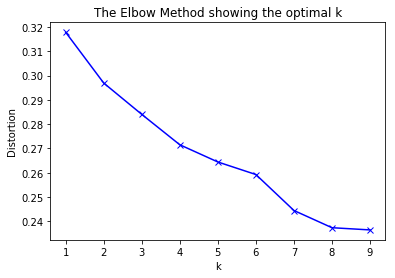

In [97]:
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt

# k means determine k
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(london_grouped_clustering)
    kmeanModel.fit(london_grouped_clustering)
    distortions.append(sum(np.min(cdist(london_grouped_clustering, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / london_grouped_clustering.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()


In [99]:
neighborhoods_venues_sorted.drop(columns = 'Cluster Labels', inplace = True) 

#### Create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [100]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

london_merged = data

london_merged = london_merged.join(neighborhoods_venues_sorted.set_index('Location'), on='Location')

london_merged

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785,368046,51.492450,0.121270,1.0,Supermarket,Historic Site,Coffee Shop,Train Station,Convenience Store,Zoo Exhibit,Food & Drink Shop,Fish & Chips Shop,Fish Market,Flea Market
1,Crossness,Bexley,LONDON,SE2,020,TQ480800,368046,51.492450,0.121270,3.0,Supermarket,Historic Site,Coffee Shop,Train Station,Convenience Store,Zoo Exhibit,Food & Drink Shop,Fish & Chips Shop,Fish Market,Flea Market
2,West Heath,Bexley,LONDON,SE2,020,TQ475775,368046,51.492450,0.121270,1.0,Supermarket,Historic Site,Coffee Shop,Train Station,Convenience Store,Zoo Exhibit,Food & Drink Shop,Fish & Chips Shop,Fish Market,Flea Market
3,Acton,Ealing,LONDON,W3,020,TQ205805,529790,51.513240,-0.267460,0.0,Gas Station,Indian Restaurant,Train Station,Park,Grocery Store,Convenience Store,Breakfast Spot,Fried Chicken Joint,Fish Market,Flea Market
4,Addington,Croydon,CROYDON,CR0,020,TQ375645,363083,51.384755,-0.051499,2.0,Grocery Store,Garden Center,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand
5,Addiscombe,Croydon,CROYDON,CR0,020,TQ345665,363083,51.384755,-0.051499,2.0,Grocery Store,Garden Center,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand
6,Coombe,Croydon,CROYDON,CR0,020,TQ342647,363083,51.384755,-0.051499,5.0,Pub,Indian Restaurant,Food,Auto Garage,Dry Cleaner,Pharmacy,Rock Club,Seafood Restaurant,Café,Gastropub
7,Croydon,Croydon,CROYDON,CR0,020,TQ335655,363083,51.384755,-0.051499,2.0,Grocery Store,Garden Center,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand
8,Forestdale,Croydon,CROYDON,CR0,020,TQ366625,363083,51.384755,-0.051499,2.0,Grocery Store,Garden Center,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand
9,New Addington,Croydon,CROYDON,CR0,020,TQ382622,363083,51.384755,-0.051499,2.0,Grocery Store,Garden Center,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand


##### There was null value in the merged data so droping the rows with null values

In [101]:
london_merged.dropna(inplace=True)

##### Because of null values the data type of 'Cluster Labels' was changed from int to float so converting it back to int

In [102]:
london_merged['Cluster Labels'] = london_merged['Cluster Labels'].astype(int)
london_merged.dtypes

Location                   object
London_borough             object
Post town                  object
Postcode district          object
Dial Code                  object
OS grid ref                object
Avg price                   int64
Latitude                  float64
Longitude                 float64
Cluster Labels              int32
1st Most Common Venue      object
2nd Most Common Venue      object
3rd Most Common Venue      object
4th Most Common Venue      object
5th Most Common Venue      object
6th Most Common Venue      object
7th Most Common Venue      object
8th Most Common Venue      object
9th Most Common Venue      object
10th Most Common Venue     object
dtype: object

### There were many Location that were assigned the same postcodes as they were very near so droping the duplicate postcodes 

In [103]:
london_merged.drop_duplicates(subset='Postcode district',inplace=True)

In [104]:
london_merged.reset_index(inplace=True)
london_merged.drop(columns='index',inplace=True)

## Visualize the clusters

In [106]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(london_merged['Latitude'],london_merged['Longitude'], london_merged['Location'], london_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

# Binning

### There is the range of Avg price so binned the price into 7 distinct values
##### ('Low level 1', 'Low level 2', 'Average level 1', 'Average level 2','Above Average','High level 1','High level 2')

Visualizing the bins

Text(0.5,1,'Price bins')

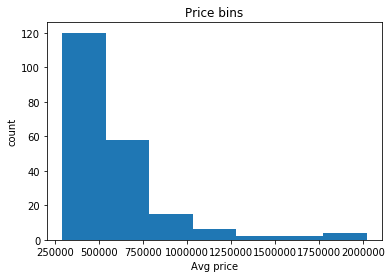

In [46]:
%matplotlib inline
import matplotlib as plt
from matplotlib import pyplot
plt.pyplot.hist(london_merged["Avg price"],bins=7)

# set x/y labels and plot title
plt.pyplot.xlabel("Avg price")
plt.pyplot.ylabel("count")
plt.pyplot.title("Price bins")

In [119]:
bins = np.linspace(min(london_merged["Avg price"]), max(london_merged["Avg price"]), 8)
bins

array([ 291623.        ,  538831.85714286,  786040.71428571,
       1033249.57142857, 1280458.42857143, 1527667.28571429,
       1774876.14285714, 2022085.        ])

In [120]:
group_names = ['Low level 1', 'Low level 2', 'Average level 1', 'Average level 2','Above Average','High level 1','High level 2']

In [121]:
london_merged['Price-Categories'] = pd.cut(london_merged['Avg price'], bins, labels=group_names, include_lowest=True )
london_merged[['Avg price','Price-Categories']].head()

,Avg price,Price-Categories
0,368046,Low level 1
1,529790,Low level 1
2,363083,Low level 1
3,460081,Low level 1
4,435638,Low level 1


## Cluster bins
### Creating 4 bins for clusters

Text(0.5,1,'Cluster Labels')

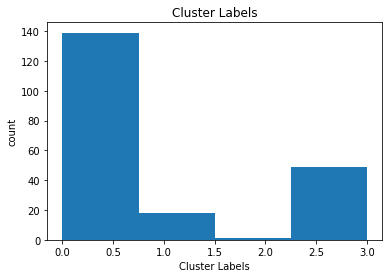

In [50]:
plt.pyplot.hist(london_merged["Cluster Labels"],bins=4)

# set x/y labels and plot title
plt.pyplot.xlabel("Cluster Labels")
plt.pyplot.ylabel("count")
plt.pyplot.title("Cluster Labels")

In [115]:
bins = np.linspace(min(london_merged["Cluster Labels"]), max(london_merged["Cluster Labels"]), 7)
bins

array([0.        , 0.83333333, 1.66666667, 2.5       , 3.33333333,
       4.16666667, 5.        ])

In [117]:
group_names = ['Mixed Social Venues','Hotels and Social Venues','Stores and seafood restaurants','Pubs and Historic places', 'Sports and Athletics','Restaurants and Bars']

In [118]:
london_merged['Cluster-Category'] = pd.cut(london_merged['Cluster Labels'], bins, labels=group_names, include_lowest=True )
london_merged[['Cluster Labels','Cluster-Category']].head()

,Cluster Labels,Cluster-Category
0,1,Hotels and Social Venues
1,0,Mixed Social Venues
2,2,Stores and seafood restaurants
3,1,Hotels and Social Venues
4,1,Hotels and Social Venues


# Final Data

In [122]:
london_merged.drop(columns=['Dial Code','OS grid ref','6th Most Common Venue','7th Most Common Venue','8th Most Common Venue','9th Most Common Venue','10th Most Common Venue'],inplace=True)
london_merged.head(20)

,Location,London_borough,Post town,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster-Category,Price-Categories
0,Abbey Wood,Bexley,LONDON,SE2,368046,51.492450,0.121270,1,Supermarket,Historic Site,Coffee Shop,Train Station,Convenience Store,Hotels and Social Venues,Low level 1
1,Acton,Ealing,LONDON,W3,529790,51.513240,-0.267460,0,Gas Station,Indian Restaurant,Train Station,Park,Grocery Store,Mixed Social Venues,Low level 1
2,Addington,Croydon,CROYDON,CR0,363083,51.384755,-0.051499,2,Grocery Store,Garden Center,Fish & Chips Shop,Fish Market,Flea Market,Stores and seafood restaurants,Low level 1
3,Albany Park,Bexley,BEXLEY,DA5,460081,51.506420,-0.127210,1,Hotel,Theater,Garden,Plaza,Art Gallery,Hotels and Social Venues,Low level 1
4,Aldborough Hatch,Redbridge,ILFORD,IG2,435638,51.506420,-0.127210,1,Hotel,Theater,Garden,Plaza,Art Gallery,Hotels and Social Venues,Low level 1
5,Aldgate,City,LONDON,EC3,1755996,51.512000,-0.080580,1,Hotel,Coffee Shop,Gym / Fitness Center,Cocktail Bar,Restaurant,Hotels and Social Venues,High level 1
6,Aldwych,Westminster,LONDON,WC2,1788666,51.516510,-0.119680,1,Theater,Hotel,Restaurant,Korean Restaurant,Coffee Shop,Hotels and Social Venues,High level 2
7,Alperton,Brent,WEMBLEY,HA0,434931,51.506420,-0.127210,1,Hotel,Theater,Garden,Plaza,Art Gallery,Hotels and Social Venues,Low level 1
8,Anerley,Bromley,LONDON,SE20,378543,51.410090,-0.056830,0,Supermarket,Grocery Store,Convenience Store,Fast Food Restaurant,Hotel,Mixed Social Venues,Low level 1
9,Angel,Islington,LONDON,EC1,867566,51.523610,-0.098770,1,Pub,Coffee Shop,Café,Food Truck,Italian Restaurant,Hotels and Social Venues,Average level 1


# Creating Chloropleth map to visualize how London is divided in terms of            Housing prices and cluster markers on the top

In [108]:
lnd_geo = r'london_boroughs_proper.geojson'
lnd_map = folium.Map(location = [latitude, longitude], zoom_start = 11)

lnd_map.choropleth(
    geo_data=lnd_geo,
    data=london_merged,
    columns=['London_borough','Avg price'],
    key_on='feature.properties.name',
    fill_color='RdPu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average house Prices'
)
# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(london_merged['Latitude'],london_merged['Longitude'], london_merged['Location'], london_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(lnd_map)
       
# display map
lnd_map

# Chloropleth map so to see how the London is clustered 

In [109]:
lnd_geo = r'london_boroughs_proper.geojson'
lnd_map = folium.Map(location = [latitude, longitude], zoom_start = 10)

lnd_map.choropleth(
    geo_data=lnd_geo,
    data=london_merged,
    columns=['London_borough','Cluster Labels'],
    key_on='feature.properties.name',
    fill_color='PuRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Cluster Labels'
)

lnd_map

# Examining the Clusters

## Cluster 1

In [123]:
london_merged[london_merged['Cluster Labels']==0]

,Location,London_borough,Post town,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster-Category,Price-Categories
1,Acton,Ealing,LONDON,W3,529790,51.513240,-0.267460,0,Gas Station,Indian Restaurant,Train Station,Park,Grocery Store,Mixed Social Venues,Low level 1
8,Anerley,Bromley,LONDON,SE20,378543,51.410090,-0.056830,0,Supermarket,Grocery Store,Convenience Store,Fast Food Restaurant,Hotel,Mixed Social Venues,Low level 1
14,Arnos Grove,Enfield,LONDON,N11,510093,51.616310,-0.138390,0,Grocery Store,Fish & Chips Shop,Train Station,Bus Stop,Convenience Store,Mixed Social Venues,Low level 1
37,Belvedere,Bexley,BELVEDERE,DA17,312387,51.485470,0.143007,0,Fast Food Restaurant,Electronics Store,Trail,Supermarket,Convenience Store,Mixed Social Venues,Low level 1
41,Blackfen,Bexley,SIDCUP,DA15,441573,51.452281,0.099797,0,Grocery Store,Construction & Landscaping,Pub,Gastropub,Bus Stop,Mixed Social Venues,Low level 1
51,Brent Park,Brent,LONDON,NW10,545554,51.539160,-0.251230,0,Grocery Store,Convenience Store,Warehouse Store,Chinese Restaurant,Sandwich Place,Mixed Social Venues,Low level 2
99,East Wickham,Bexley,WELLING,DA16,415672,51.459075,0.099121,0,Construction & Landscaping,Indian Restaurant,Resort,Grocery Store,Zoo Exhibit,Mixed Social Venues,Low level 1
127,Hampton Wick,Richmond upon Thames,KINGSTON UPON THAMES,KT1,493000,51.351429,-0.249881,0,Grocery Store,Convenience Store,Beer Garden,Park,Food Court,Mixed Social Venues,Low level 1
175,Plumstead,Greenwich,LONDON,SE18,402499,51.482070,0.071430,0,Grocery Store,Bus Stop,Chinese Restaurant,Indian Restaurant,Fish & Chips Shop,Mixed Social Venues,Low level 1
183,Rush Green,Barking and Dagenham,ROMFORD,RM7,351837,51.574088,0.167940,0,Racetrack,Park,Grocery Store,Zoo Exhibit,Food Court,Mixed Social Venues,Low level 1


## Cluster 2

In [124]:
london_merged[london_merged['Cluster Labels']==1]

,Location,London_borough,Post town,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster-Category,Price-Categories
0,Abbey Wood,Bexley,LONDON,SE2,368046,51.492450,0.121270,1,Supermarket,Historic Site,Coffee Shop,Train Station,Convenience Store,Hotels and Social Venues,Low level 1
3,Albany Park,Bexley,BEXLEY,DA5,460081,51.506420,-0.127210,1,Hotel,Theater,Garden,Plaza,Art Gallery,Hotels and Social Venues,Low level 1
4,Aldborough Hatch,Redbridge,ILFORD,IG2,435638,51.506420,-0.127210,1,Hotel,Theater,Garden,Plaza,Art Gallery,Hotels and Social Venues,Low level 1
5,Aldgate,City,LONDON,EC3,1755996,51.512000,-0.080580,1,Hotel,Coffee Shop,Gym / Fitness Center,Cocktail Bar,Restaurant,Hotels and Social Venues,High level 1
6,Aldwych,Westminster,LONDON,WC2,1788666,51.516510,-0.119680,1,Theater,Hotel,Restaurant,Korean Restaurant,Coffee Shop,Hotels and Social Venues,High level 2
7,Alperton,Brent,WEMBLEY,HA0,434931,51.506420,-0.127210,1,Hotel,Theater,Garden,Plaza,Art Gallery,Hotels and Social Venues,Low level 1
9,Angel,Islington,LONDON,EC1,867566,51.523610,-0.098770,1,Pub,Coffee Shop,Café,Food Truck,Italian Restaurant,Hotels and Social Venues,Average level 1
10,Aperfield,Bromley,WESTERHAM,TN16,484525,51.271726,0.074710,1,Gas Station,Historic Site,Soccer Field,Gym / Fitness Center,Zoo Exhibit,Hotels and Social Venues,Low level 1
12,Ardleigh Green,Havering,HORNCHURCH,RM11,502415,51.583700,0.174760,1,Clothing Store,Bus Station,Furniture / Home Store,Music Store,Café,Hotels and Social Venues,Low level 1
22,Barnet Gate,Barnet,LONDON,NW7,699608,51.615680,-0.245110,1,Grocery Store,Italian Restaurant,Platform,Park,Coffee Shop,Hotels and Social Venues,Low level 2


## Cluster 3

In [125]:
london_merged[london_merged['Cluster Labels']==2]

,Location,London_borough,Post town,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster-Category,Price-Categories
2,Addington,Croydon,CROYDON,CR0,363083,51.384755,-0.051499,2,Grocery Store,Garden Center,Fish & Chips Shop,Fish Market,Flea Market,Stores and seafood restaurants,Low level 1


## Cluster 4

In [126]:
london_merged[london_merged['Cluster Labels']==3]

,Location,London_borough,Post town,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster-Category,Price-Categories
17,Barking,Barking and Dagenham,BARKING,IG11,291623,51.533120,0.084077,3,Grocery Store,Spa,Supermarket,Plaza,Zoo Exhibit,Pubs and Historic places,Low level 1
18,Barkingside,Redbridge,ILFORD,IG6,466762,51.506420,-0.127210,3,Hotel,Theater,Garden,Plaza,Art Gallery,Pubs and Historic places,Low level 1
19,Barnehurst,Bexley,BEXLEYHEATH,DA7,474435,51.470520,0.146706,3,Pub,Convenience Store,Indian Restaurant,Food Stand,Fish & Chips Shop,Pubs and Historic places,Low level 1
20,Barnes,Richmond upon Thames,LONDON,SW13,1058667,51.474570,-0.242120,3,Pub,Italian Restaurant,Park,Pizza Place,Farmers Market,Pubs and Historic places,Average level 2
21,Barnes Cray,Bexley,DARTFORD,DA1,297415,51.452068,0.172230,3,Pub,Italian Restaurant,Track Stadium,Mediterranean Restaurant,Supermarket,Pubs and Historic places,Low level 1
75,Cockfosters,Barnet,BARNET,EN4,725587,51.506420,-0.127210,3,Hotel,Theater,Garden,Plaza,Art Gallery,Pubs and Historic places,Low level 2
76,Colindale,Barnet,LONDON,NW9,440974,51.584860,-0.248810,3,Asian Restaurant,Pub,Hotel,Café,Supermarket,Pubs and Historic places,Low level 1
77,Colliers Wood,Merton,LONDON,SW19,581984,51.421700,-0.207960,3,Pub,Bar,Coffee Shop,Sushi Restaurant,Clothing Store,Pubs and Historic places,Low level 2
78,Colyers,Bexley,ERITH,DA8,297285,51.506420,-0.127210,3,Hotel,Theater,Garden,Plaza,Art Gallery,Pubs and Historic places,Low level 1
79,Coney Hall,Bromley,WEST WICKHAM,BR4,570326,51.506420,-0.127210,3,Hotel,Theater,Garden,Plaza,Art Gallery,Pubs and Historic places,Low level 2


## Cluster 5

In [127]:
london_merged[london_merged['Cluster Labels']==4]

,Location,London_borough,Post town,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster-Category,Price-Categories
26,Beckenham,Bromley,BECKENHAM,BR3,432717,51.415095,-0.035403,4,Athletics & Sports,Train Station,Park,Zoo Exhibit,Food Court,Sports and Athletics,Low level 1
44,Blackwall,Tower Hamlets,LONDON,E14,612250,51.511220,-0.012640,4,Park,Café,Coffee Shop,Light Rail Station,Chinese Restaurant,Sports and Athletics,Low level 2
48,Bowes Park,Haringey,LONDON,N22,507810,51.602140,-0.112230,4,Italian Restaurant,Bus Stop,Park,Gym,Bar,Sports and Athletics,Low level 1
87,Cudham,Bromley,SEVENOAKS,TN14,582195,51.345030,0.132726,4,Train Station,Golf Course,Zoo Exhibit,Food Stand,Fish & Chips Shop,Sports and Athletics,Low level 2
100,Eastcote,Hillingdon,PINNER,HA5,577756,51.612911,-0.376966,4,Trail,Park,Athletics & Sports,Zoo Exhibit,Food Court,Sports and Athletics,Low level 2
104,Eltham,Greenwich,LONDON,SE9,447029,51.444630,0.052120,4,Historic Site,Bus Stop,Golf Course,Park,Zoo Exhibit,Sports and Athletics,Low level 1
158,Mitcham,Merton,MITCHAM,CR4,376319,51.402625,-0.143638,4,Fast Food Restaurant,Construction & Landscaping,Bus Stop,Park,Fish Market,Sports and Athletics,Low level 1


## Cluster 6

In [128]:
london_merged[london_merged['Cluster Labels']==5]

,Location,London_borough,Post town,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Cluster-Category,Price-Categories
11,Archway,Islington,LONDON,N19,572984,51.563930,-0.129450,5,Grocery Store,Coffee Shop,Pub,Italian Restaurant,Pizza Place,Restaurants and Bars,Low level 2
13,Arkley,Barnet,BARNET,EN5,630230,51.644415,-0.179185,5,Pub,Coffee Shop,Recruiting Agency,Bus Stop,Food Stand,Restaurants and Bars,Low level 2
15,Balham,Wandsworth,LONDON,SW12,665289,51.448220,-0.148390,5,Coffee Shop,Grocery Store,Pub,Indian Restaurant,Bakery,Restaurants and Bars,Low level 2
16,Bankside,Southwark,LONDON,SE1,923979,51.499600,-0.096130,5,Pub,Coffee Shop,Café,Sandwich Place,Park,Restaurants and Bars,Average level 1
24,Battersea,Wandsworth,LONDON,SW11,894664,51.467600,-0.162900,5,Café,Indian Restaurant,Pub,Supermarket,Bar,Restaurants and Bars,Average level 1
36,Belsize Park,Camden,LONDON,NW3,1116304,51.555060,-0.173480,5,Pub,Café,Bakery,Italian Restaurant,Indian Restaurant,Restaurants and Bars,Average level 2
39,Bethnal Green,Tower Hamlets,LONDON,E2,567474,51.526690,-0.062570,5,Café,Coffee Shop,Pub,Brewery,Cocktail Bar,Restaurants and Bars,Low level 2
43,Blackheath,Lewisham,LONDON,SE3,532359,51.471380,0.023380,5,Pharmacy,Pub,Zoo Exhibit,Food Stand,Fish & Chips Shop,Restaurants and Bars,Low level 1
45,Bloomsbury,Camden,LONDON,WC1,958499,51.524500,-0.122730,5,Pub,Café,Coffee Shop,Hotel,Garden,Restaurants and Bars,Average level 1
46,Botany Bay,Enfield,ENFIELD,EN2,528764,51.653660,-0.110614,5,Pub,Flower Shop,Lake,Zoo Exhibit,Food Stand,Restaurants and Bars,Low level 1


# Examining Property prices

In [95]:
london_merged[london_merged['Price-Categories']=='High level 2']

,Location,London_borough,Post town,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
6,Aldwych,Westminster,LONDON,WC2,1788666,51.51651,-0.11968,0,Theater,Hotel,Restaurant,Korean Restaurant,Coffee Shop,High level 2,Mixed Social Venues
69,Chinatown,Westminster,LONDON,W1,1829030,51.51648,-0.14816,0,French Restaurant,Coffee Shop,Italian Restaurant,Burger Joint,Clothing Store,High level 2,Mixed Social Venues
139,Holland Park,Kensington and Chelsea,LONDON,W8,1819390,51.50162,-0.19173,0,Hotel,Italian Restaurant,Clothing Store,Pub,Juice Bar,High level 2,Mixed Social Venues
147,Kensington,Kensington and Chelsea,LONDON,SW7,2022085,51.49807,-0.17404,0,Café,Exhibit,Science Museum,Hotel,Garden,High level 2,Mixed Social Venues


In [86]:
london_merged[london_merged['Price-Categories']=='High level 1']

,Location,London_borough,Post town,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
5,Aldgate,City,LONDON,EC3,1755996,51.51200,-0.08058,0,Hotel,Coffee Shop,Gym / Fitness Center,Cocktail Bar,Restaurant,High level 1,Mixed Social Venues
56,Brompton,Kensington and ChelseaHammersmith and Fulham,LONDON,SW3,1712902,51.49014,-0.16248,0,Hotel,Italian Restaurant,Pub,Café,English Restaurant,High level 1,Mixed Social Venues


In [87]:
london_merged[london_merged['Price-Categories']=='Low level 2']

,Location,London_borough,Post town,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
11,Archway,Islington,LONDON,N19,572984,51.563930,-0.129450,0,Grocery Store,Coffee Shop,Pub,Italian Restaurant,Pizza Place,Low level 2,Mixed Social Venues
13,Arkley,Barnet,BARNET,EN5,630230,51.644415,-0.179185,3,Pub,Coffee Shop,Recruiting Agency,Bus Stop,Food Stand,Low level 2,"Pubs,bars and Fitness"
15,Balham,Wandsworth,LONDON,SW12,665289,51.448220,-0.148390,0,Coffee Shop,Grocery Store,Pub,Indian Restaurant,Bakery,Low level 2,Mixed Social Venues
22,Barnet Gate,Barnet,LONDON,NW7,699608,51.615680,-0.245110,0,Grocery Store,Italian Restaurant,Platform,Park,Coffee Shop,Low level 2,Mixed Social Venues
23,Barnsbury,Islington,LONDON,N1,726239,51.537920,-0.099830,0,Pub,French Restaurant,Mediterranean Restaurant,Burger Joint,Gastropub,Low level 2,Mixed Social Venues
31,Bedford Park,Ealing,LONDON,W4,734142,51.489440,-0.261940,3,Italian Restaurant,Pub,Bakery,Bookstore,Café,Low level 2,"Pubs,bars and Fitness"
39,Bethnal Green,Tower Hamlets,LONDON,E2,567474,51.526690,-0.062570,3,Café,Coffee Shop,Pub,Brewery,Cocktail Bar,Low level 2,"Pubs,bars and Fitness"
44,Blackwall,Tower Hamlets,LONDON,E14,612250,51.511220,-0.012640,0,Park,Café,Coffee Shop,Light Rail Station,Chinese Restaurant,Low level 2,Mixed Social Venues
50,Brent Cross,Barnet,LONDON,NW2,545954,51.562370,-0.221310,0,Music Venue,Historic Site,Gym / Fitness Center,Hookah Bar,Supermarket,Low level 2,Mixed Social Venues
51,Brent Park,Brent,LONDON,NW10,545554,51.539160,-0.251230,0,Grocery Store,Convenience Store,Warehouse Store,Chinese Restaurant,Sandwich Place,Low level 2,Mixed Social Venues


In [96]:
london_merged[london_merged['Price-Categories']=='Low level 1']

,Location,London_borough,Post town,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
0,Abbey Wood,Bexley,LONDON,SE2,368046,51.492450,0.121270,0,Supermarket,Historic Site,Coffee Shop,Train Station,Convenience Store,Low level 1,Mixed Social Venues
1,Acton,Ealing,LONDON,W3,529790,51.513240,-0.267460,0,Gas Station,Indian Restaurant,Train Station,Park,Grocery Store,Low level 1,Mixed Social Venues
2,Addington,Croydon,CROYDON,CR0,363083,51.384755,-0.051499,2,Grocery Store,Garden Center,Fish & Chips Shop,Fish Market,Flea Market,Low level 1,Stores and seafood restaurants
3,Albany Park,Bexley,BEXLEY,DA5,460081,51.506420,-0.127210,0,Hotel,Theater,Garden,Plaza,Art Gallery,Low level 1,Mixed Social Venues
4,Aldborough Hatch,Redbridge,ILFORD,IG2,435638,51.506420,-0.127210,0,Hotel,Theater,Garden,Plaza,Art Gallery,Low level 1,Mixed Social Venues
7,Alperton,Brent,WEMBLEY,HA0,434931,51.506420,-0.127210,0,Hotel,Theater,Garden,Plaza,Art Gallery,Low level 1,Mixed Social Venues
8,Anerley,Bromley,LONDON,SE20,378543,51.410090,-0.056830,0,Supermarket,Grocery Store,Convenience Store,Fast Food Restaurant,Hotel,Low level 1,Mixed Social Venues
10,Aperfield,Bromley,WESTERHAM,TN16,484525,51.271726,0.074710,0,Gas Station,Historic Site,Soccer Field,Gym / Fitness Center,Zoo Exhibit,Low level 1,Mixed Social Venues
12,Ardleigh Green,Havering,HORNCHURCH,RM11,502415,51.583700,0.174760,0,Clothing Store,Bus Station,Furniture / Home Store,Music Store,Café,Low level 1,Mixed Social Venues
14,Arnos Grove,Enfield,LONDON,N11,510093,51.616310,-0.138390,0,Grocery Store,Fish & Chips Shop,Train Station,Bus Stop,Convenience Store,Low level 1,Mixed Social Venues
